## 1-1. 컬럼 중 주요요인
 - 전체 컬럼을 대상으로 상관관계를 분석했으며, 이중 0.4 이상 1.0미만의 값을 나타내는 칼럼중 갯수를 기준으로 했습니다. 
    - 상관관계는 아래 전처리 과정에서 확인할 수 있습니다.
 - Schooling, Income composition of resources, infant deaths, GDP를 위주로 살펴보겠습니다.


# 2. 패키지 임포트 및 데이터 로드

## 2-1. 패키지 임포트

In [17]:
import pycountry_convert as pc
import pandas as pd
import numpy as np
import koreanize_matplotlib 
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import datetime as dt
import plotly.graph_objects as go
import folium
import sklearn
from sklearn.impute import SimpleImputer
import warnings
plt.style.use('dark_background')
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
# warnings.filterwarnings('ignore')
pd.set_option('display.max.columns', None)
import os
for dirname, _, filenames in os.walk('Life Expectancy Data.csv') :
    for filename in filenames :
        print(os.path.join(dirname, filename))


## 2-2. 데이터 로드








In [18]:
df = pd.read_csv('Life Expectancy Data.csv')

df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [19]:
df.shape

(2938, 22)

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [21]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

# 3. 데이터 전처리 

## 3-1. 칼럼이름에 공백이 있어서 strip로 양쪽 공백을 제거 및  nan 값을 의미있는 값으로 대체하기 

In [22]:
df.columns = list(map(lambda x : x.strip(), df.columns))

df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

In [23]:
# df.isnull().sum()했을때 sum이 나온 값만 fit_transform을 합니다.

imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean', fill_value=None)
# 기대수명
df['Life expectancy'] = imputer.fit_transform(df[['Life expectancy']]) 
# 성인사망률
df['Adult Mortality'] = imputer.fit_transform(df[['Adult Mortality']])
# 알코올
df['Alcohol'] = imputer.fit_transform(df[['Alcohol']])
# 간염 B
df['Hepatitis B'] = imputer.fit_transform(df[['Hepatitis B']])
# BMI
df['BMI'] = imputer.fit_transform(df[['BMI']])
# 소아마비
df['Polio'] = imputer.fit_transform(df[['Polio']])
# 총지출
df['Total expenditure'] = imputer.fit_transform(df[['Total expenditure']])
# 디프테리아라는 병
df['Diphtheria'] = imputer.fit_transform(df[['Diphtheria']])
# GDP
df['GDP'] = imputer.fit_transform(df[['GDP']])
# 인구
df['Population'] = imputer.fit_transform(df[['Population']])
# 1 ~ 19세의 마른정도
df['thinness  1-19 years'] = imputer.fit_transform(df[['thinness  1-19 years']])
# 5 ~ 9세의 마른정도
df['thinness 5-9 years'] = imputer.fit_transform(df[['thinness 5-9 years']])
# 자원의 소득 구성
df['Income composition of resources'] = imputer.fit_transform(df[['Income composition of resources']])
# 학교 교육
df['Schooling']=imputer.fit_transform(df[['Schooling']])

# imputer.fit_transform 을 통해 nan값이 없어졌음을 알수있습니다.
df.isnull().sum()
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


# 4. 기대수명에 영향을 끼치는 요인 분석

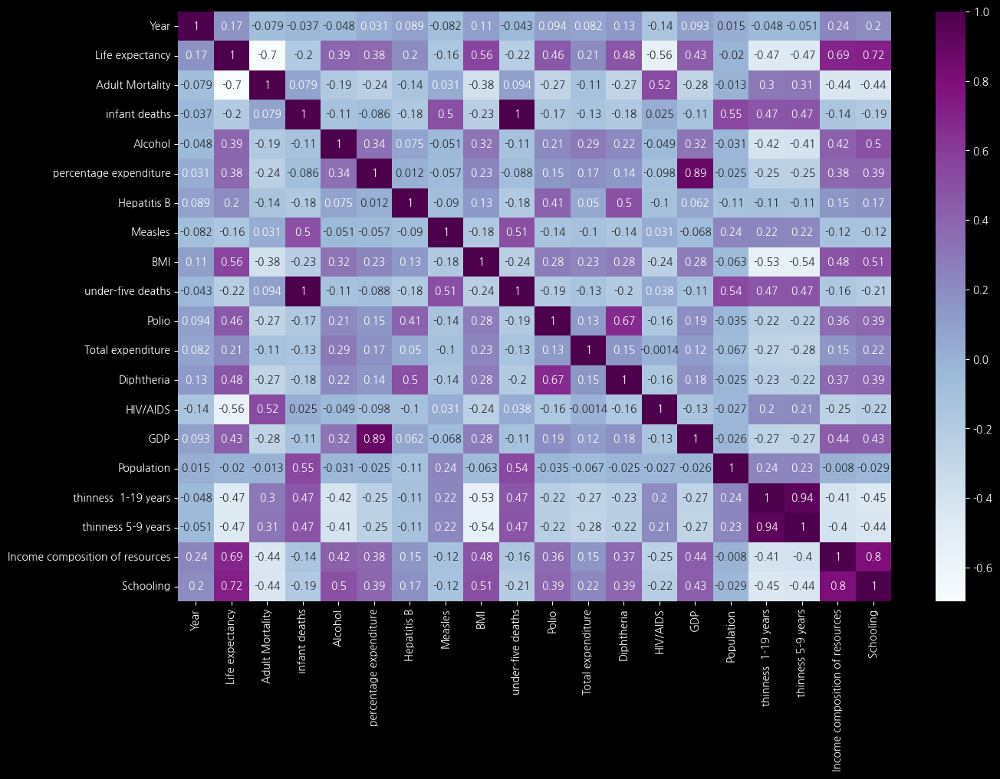

In [24]:
# heatmap를 통해 상관관계를 확인할수있다.
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='BuPu')
plt.show()


### 상관관계가 있다고 판단되는 0.4 이상 1.0미만인 칼럼만 살펴보겠습니다.

In [25]:
df.corr(numeric_only=True)[(df.corr(numeric_only=True) >= 0.4)  & (df.corr(numeric_only=True) < 1)].notnull().sum()

Year                               0
Life expectancy                    6
Adult Mortality                    1
infant deaths                      5
Alcohol                            2
percentage expenditure             1
Hepatitis B                        2
Measles                            2
BMI                                3
under-five deaths                  5
Polio                              3
Total expenditure                  0
Diphtheria                         3
HIV/AIDS                           1
GDP                                4
Population                         2
thinness  1-19 years               3
thinness 5-9 years                 3
Income composition of resources    5
Schooling                          5
dtype: int64

### Schooling, Income composition of resources, infant deaths, GDP 및 under-five deaths가 주된 요인으로 나왔으며 under-five deaths는 infant deaths와 같은 내용이라 판단하고 따로 분석하지 않겠습니다.

# 5. 시각화

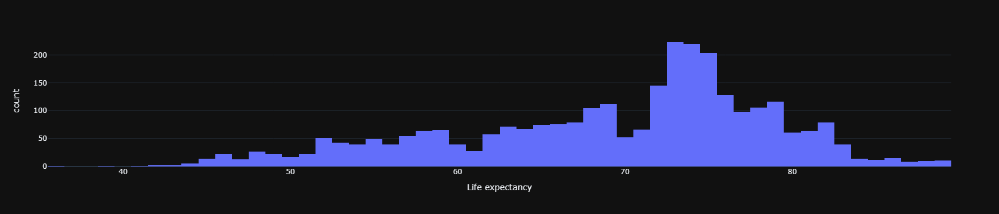

In [26]:
fig = px.histogram(df, x = 'Life expectancy',template='plotly_dark' )
fig.show()

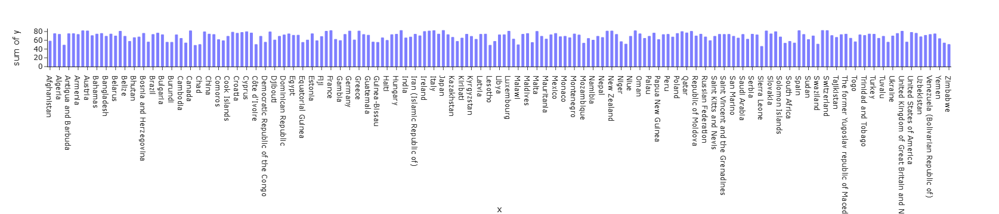

<Figure size 1500x50000 with 0 Axes>

In [27]:
# 국가별 기대수명 평균구하기
data = df.groupby(['Country']).mean(numeric_only=True)
x = df.groupby(['Country']).mean(numeric_only=True).index
y = df.groupby(['Country']).mean(numeric_only=True)['Life expectancy']

plt.figure(figsize=(15,500))
fig = px.histogram(data, x = x, y= y , template='simple_white' )
# 막대와 막대사이 간격 조정
fig.update_layout(bargap=0.5)

#히스토그램 스타일 변경
fig.update_traces(marker_color = 'blue', marker_line_width=1, marker_line_color='blue', marker_opacity =0.5)
fig.show()

## 5-1. 주요 요인별 시각화

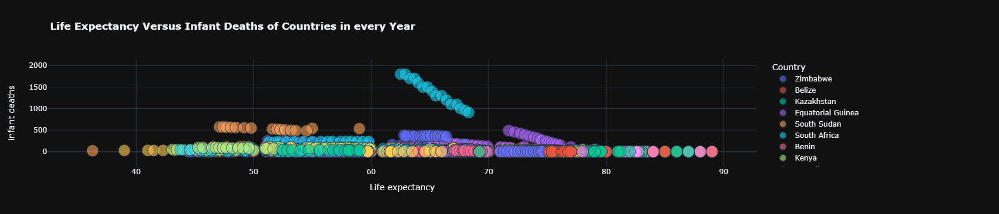

In [28]:
### 영아 사망률 감소로 기대수명 증가

px.scatter(df.sort_values(by='Year'), x= 'Life expectancy', y ='infant deaths' ,template='plotly_dark',size='Year',color='Country',opacity=0.6,title='<b>Life Expectancy Versus Infant Deaths of Countries in every Year')

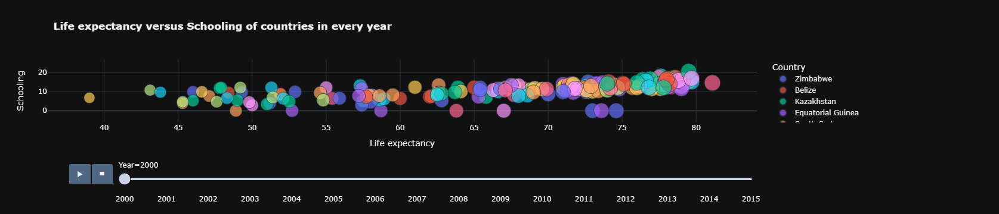

In [29]:
px.scatter(df.sort_values(by='Year'), x = 'Life expectancy', y='Schooling', animation_frame = 'Year', animation_group='Country', template='plotly_dark', color='Country',size='Life expectancy',title='<b> Life expectancy versus Schooling of countries in every year') 

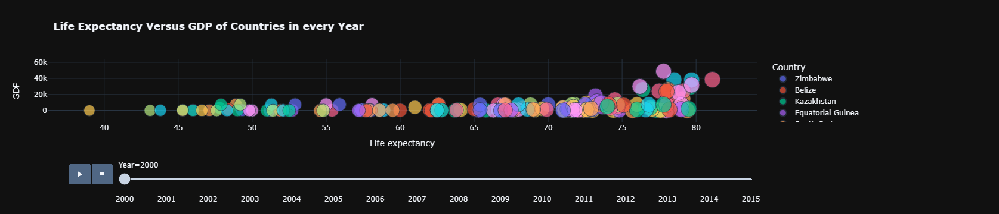

In [30]:
px.scatter(df.sort_values(by='Year'), x = 'Life expectancy', y = 'GDP', animation_frame = 'Year', animation_group = 'Country', template = 'plotly_dark', color = 'Country', size = 'Life expectancy', title = '<b> Life Expectancy Versus GDP of Countries in every Year')

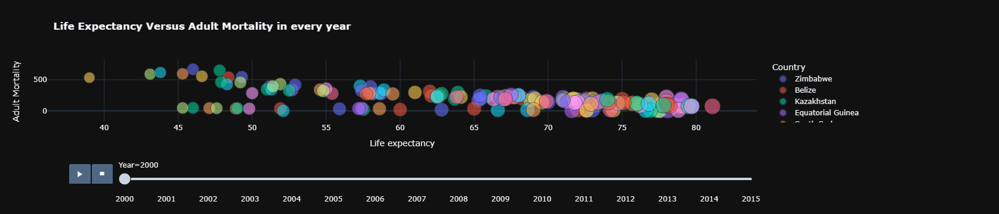

In [31]:
px.scatter(df.sort_values(by='Year'), x = 'Life expectancy', y = 'Adult Mortality', animation_frame = 'Year', animation_group = 'Country', color = 'Country', size = 'Life expectancy', opacity = 0.6, template = 'plotly_dark', title = '<b> Life Expectancy Versus Adult Mortality in every year')

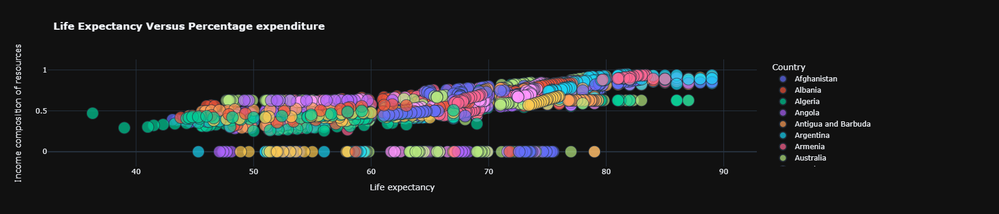

In [32]:


px.scatter(df, x='Life expectancy', y = 'Income composition of resources', color = 'Country', size = 'Year',template='plotly_dark',title='<b> Life Expectancy Versus Percentage expenditure')
 

# 6. 선진국, 개발도상국으로 나눠서 비교

In [33]:
df_develop = df.copy()
df_develop.columns = list(map(lambda x : x.strip(), df_develop.columns)) 
df_develop =  df_develop.groupby('Status').mean(numeric_only=True)
df_develop

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Status,,,,,,,,,,,,,,,,,,,,
Developed,2007.500000,79.197852,79.685547,1.494141,9.541055,2703.600380,85.641992,499.005859,51.803906,1.810547,93.736328,7.453051,93.476562,0.100000,20232.107949,7.940676e+06,1.320703,1.296680,0.831401,15.484285
Developing,2007.522671,67.120177,182.758848,36.384171,3.560670,323.470285,79.948217,2824.926216,35.475772,50.525144,80.189387,5.618483,79.970386,2.088664,4792.531044,1.376908e+07,5.582378,5.624522,0.584529,11.255924


In [34]:
df_main = df_develop[['Adult Mortality', 'infant deaths', 'Alcohol', 'HIV/AIDS', 'GDP', 'Schooling']]
df_graph = df_main.reset_index()
df_graph


,Status,Adult Mortality,infant deaths,Alcohol,HIV/AIDS,GDP,Schooling
0,Developed,79.685547,1.494141,9.541055,0.100000,20232.107949,15.484285
1,Developing,182.758848,36.384171,3.560670,2.088664,4792.531044,11.255924


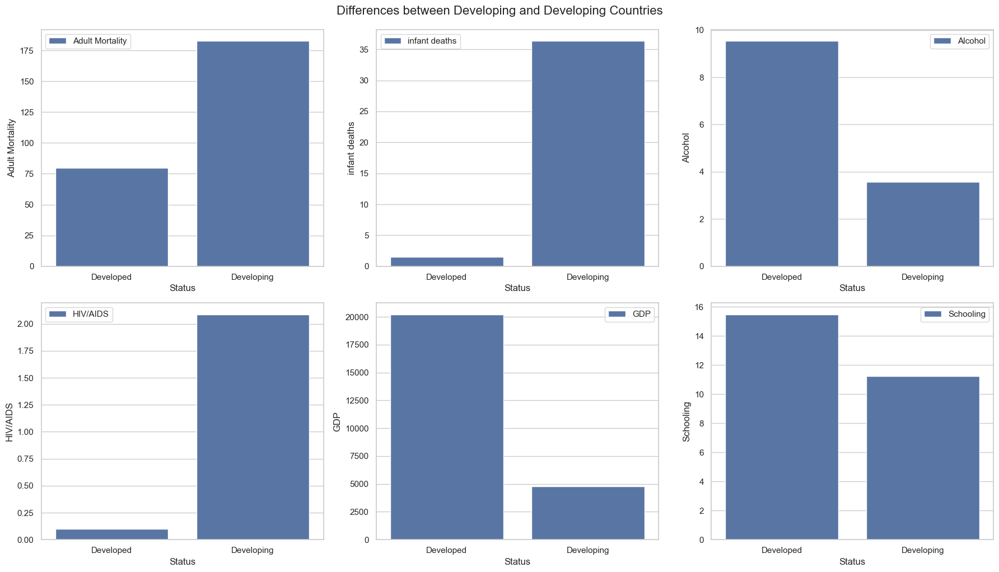

In [35]:
sns.set(style="whitegrid")

# 바 플롯 그리기
plt.figure(figsize=(18, 10))
plt.subplot(2,3,1)
sns.barplot(x= df_graph.Status, y=df_graph['Adult Mortality'], data=df_graph, label='Adult Mortality')

plt.subplot(2,3,2)
sns.barplot(x= df_graph.Status, y=df_graph['infant deaths'], data=df_graph, label='infant deaths')
plt.subplot(2,3,3)
sns.barplot(x= df_graph.Status, y=df_graph['Alcohol'], data=df_graph, label='Alcohol')
plt.subplot(2,3,4)
sns.barplot(x= df_graph.Status, y=df_graph['HIV/AIDS'], data=df_graph, label='HIV/AIDS')
plt.subplot(2,3,5)
sns.barplot(x= df_graph.Status, y=df_graph['GDP'], data=df_graph, label='GDP')
plt.subplot(2,3,6)
sns.barplot(x= df_graph.Status, y=df_graph['Schooling'], data=df_graph, label='Schooling')




# plt.title('Life Expectancy')
plt.tight_layout()
plt.suptitle('Differences between Developing and Developing Countries', y=1.02, fontsize=16)

plt.show()

# 7. GDP 상위 10개국과 하위 10개국의 기대수명과 상관관계가 높은 변수들에 대한 막대 그래프

기대수명에 부정적인 변수에 대해서는 확연하게 GDP 하위 국가들의 수치가 높다

In [39]:
df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [51]:
# Life_expectancy와 상관계수가 0.4 이상인 컬럼명만 조회
corr_temp = df.corr(numeric_only=True).loc['Life expectancy',:].abs().sort_values(ascending=False)
corr_temp[corr_temp >= 0.4]
high_corr_col = corr_temp[corr_temp > 0.4].index.tolist()

# 전체 데이터에서 2015년에 대한 데이터만 추출 후 Life_expectancy와 상관계수가 0.4 이상인 컬럼 및 국가명,국가상태 컬럼으로 데이터프레임 생성
df_2015 = df[df['Year'] == 2015]
df_2015 = df_2015.sort_values(by='GDP').reset_index(drop=True)
df_2015_corr_high = df_2015.loc[:,['Country','Status']+high_corr_col]

# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# for col in df_2015_corr_high_GDP_high.select_dtypes(exclude='O').columns:
#     df_2015_corr_high[[col]] = scaler.fit_transform(df_2015_corr_high[[col]])

# GDP 상위 10개국, 하위 10개국만 추출
df_2015_corr_high_GDP_low = df_2015_corr_high.iloc[:10,:]
df_2015_corr_high_GDP_high = df_2015_corr_high.iloc[-10:,:]
df_2015_corr_high_GDP_low.drop('GDP',axis=1,inplace=True)
df_2015_corr_high_GDP_high.drop('GDP',axis=1,inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_4812\336904440.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_4812\336904440.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



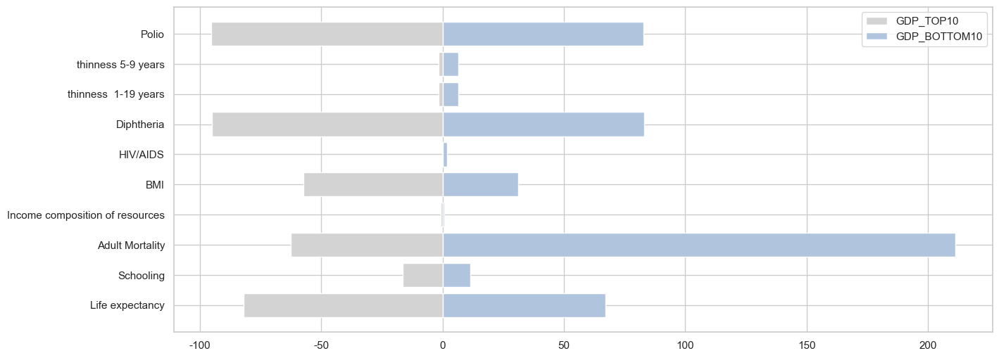

In [52]:
fig, ax = plt.subplots(1,1, figsize=(15,6))

ax.barh(df_2015_corr_high_GDP_low.select_dtypes(exclude='O').columns, -df_2015_corr_high_GDP_high.mean(numeric_only=True,axis=0), color = 'lightgrey')
ax.barh(df_2015_corr_high_GDP_low.select_dtypes(exclude='O').columns, df_2015_corr_high_GDP_low.mean(numeric_only=True,axis=0), color = 'lightsteelblue')
ax.legend(['GDP_TOP10', 'GDP_BOTTOM10'], loc="best")
plt.show()

# 8. 결론

 - 상관관계 분석을 통해 Schooling, Income composition of resources, infant deaths, GDP 및 under-five deaths가 기대수명의 주요한 요소임을 알게되었다.
 - 선진국(Developed): 평균 기대 수명은 약 79.2년, 개발도상국(Developing): 평균 기대 수명은 약 67.1년으로
 - 주요 요인들이 이들의 차이를 발생시킴을 알 수 있다.


# * 별첨 : 세계지도

In [53]:
fips_data = df.copy()

fips_data = fips_data.loc[:, ['Country', 'Life expectancy', 'Status', 'GDP']]
fips_data.columns = list(map(lambda x : x.strip(), fips_data.columns))
fips_data1= fips_data.groupby('Country').mean(numeric_only=True).sort_values(by='Life expectancy', ascending=False).fillna(0)
fips_data1

,Life expectancy,GDP
Country,,
Japan,82.53750,24892.544784
Sweden,82.51875,29334.990639
Iceland,82.44375,30159.502907
Switzerland,82.33125,57362.874601
France,82.21875,26465.551381
...,...,...
Malawi,49.89375,237.504042
Angola,49.01875,1975.143045
Lesotho,48.78125,794.523010


In [54]:
# fips_data1에 값을 넣어줄 예정
fips_data1['percentage'] = np.arange(1,194)
fips_data1['percentage'] = fips_data1['percentage']/193 * 100

# 퍼센트를 소수점 2자리에서 까지 만 표시하게 반올림했다.
fips_data1['percentage'] = list(map(lambda x : round(x,2), fips_data1['percentage'].values))

fips_data1

,Life expectancy,GDP,percentage
Country,,,
Japan,82.53750,24892.544784,0.52
Sweden,82.51875,29334.990639,1.04
Iceland,82.44375,30159.502907,1.55
Switzerland,82.33125,57362.874601,2.07
France,82.21875,26465.551381,2.59
...,...,...,...
Malawi,49.89375,237.504042,97.93
Angola,49.01875,1975.143045,98.45
Lesotho,48.78125,794.523010,98.96


In [55]:
# fips_data1에 percent라는 칼럼이 추가되었음을 알수있음.
fips_data_percent = fips_data1.copy()
fips_data1

,Life expectancy,GDP,percentage
Country,,,
Japan,82.53750,24892.544784,0.52
Sweden,82.51875,29334.990639,1.04
Iceland,82.44375,30159.502907,1.55
Switzerland,82.33125,57362.874601,2.07
France,82.21875,26465.551381,2.59
...,...,...,...
Malawi,49.89375,237.504042,97.93
Angola,49.01875,1975.143045,98.45
Lesotho,48.78125,794.523010,98.96


In [56]:
# 칼럼을 새로 만들려고 fips_data_col을 임의로 만들어서 사용함.
fips_data_col = fips_data.groupby(['Country','Status']).mean(numeric_only=True).index
fips_data_col

MultiIndex([(                       'Afghanistan', 'Developing'),
            (                           'Albania', 'Developing'),
            (                           'Algeria', 'Developing'),
            (                            'Angola', 'Developing'),
            (               'Antigua and Barbuda', 'Developing'),
            (                         'Argentina', 'Developing'),
            (                           'Armenia', 'Developing'),
            (                         'Australia',  'Developed'),
            (                           'Austria',  'Developed'),
            (                        'Azerbaijan', 'Developing'),
            ...
            (       'United Republic of Tanzania', 'Developing'),
            (          'United States of America',  'Developed'),
            (                           'Uruguay', 'Developing'),
            (                        'Uzbekistan', 'Developing'),
            (                           'Vanuatu', 'Developi

In [57]:
# 이거로 Status에 developed, developing 갖다 붙임
# develop_list만 이용해서 데이터에 추가함

country_list = []
develop_list = []
for country, deveolp in list(fips_data_col):
    country_list.append(country)
    develop_list.append(deveolp)


print(country_list)
print("-"*100)
print(develop_list)
# 값을 추가할 칼럼이 완성되었음을 알수있음.

['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czechia', "Côte d'Ivoire", "Democratic People's Republic of Korea", 'Democratic Republic of the Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Hungary

In [58]:
# status의 상태까지 추가했다.
# fips_data_percent 에 추가를 하자

fips_data_percent['Status'] = develop_list

In [59]:
fips_data_country = fips_data_percent.copy()
fips_data_country

,Life expectancy,GDP,percentage,Status
Country,,,,
Japan,82.53750,24892.544784,0.52,Developing
Sweden,82.51875,29334.990639,1.04,Developing
Iceland,82.44375,30159.502907,1.55,Developing
Switzerland,82.33125,57362.874601,2.07,Developing
France,82.21875,26465.551381,2.59,Developing
...,...,...,...,...
Malawi,49.89375,237.504042,97.93,Developing
Angola,49.01875,1975.143045,98.45,Developing
Lesotho,48.78125,794.523010,98.96,Developing


In [60]:
# index :The former Yugoslav republic of Macedonia 를 Macedonia로 바꾸고 위도 경도를 찾자.
fips_data_country= fips_data_country.rename(index = {'The former Yugoslav republic of Macedonia' : 'Macedonia'})

In [61]:
# 인덱스에 있는 이름만 추출
list_index = list(fips_data_country.index)
list_index

['Japan',
 'Sweden',
 'Iceland',
 'Switzerland',
 'France',
 'Italy',
 'Spain',
 'Australia',
 'Norway',
 'Canada',
 'Austria',
 'Singapore',
 'New Zealand',
 'Israel',
 'Greece',
 'Germany',
 'Netherlands',
 'United Kingdom of Great Britain and Northern Ireland',
 'Luxembourg',
 'Finland',
 'Belgium',
 'Republic of Korea',
 'Malta',
 'Ireland',
 'Portugal',
 'Slovenia',
 'Cyprus',
 'Chile',
 'Denmark',
 'Costa Rica',
 'United States of America',
 'Cuba',
 'Qatar',
 'Czechia',
 'Panama',
 'Brunei Darussalam',
 'Croatia',
 'Uruguay',
 'Bosnia and Herzegovina',
 'Bahrain',
 'Mexico',
 'United Arab Emirates',
 'Poland',
 'Maldives',
 'Albania',
 'Argentina',
 'Antigua and Barbuda',
 'Estonia',
 'Oman',
 'Viet Nam',
 'Slovakia',
 'Ecuador',
 'Montenegro',
 'Tunisia',
 'Barbados',
 'Jamaica',
 'Bahamas',
 'China',
 'Lebanon',
 'Macedonia',
 'Romania',
 'Serbia',
 'Turkey',
 'Iran (Islamic Republic of)',
 'Kuwait',
 'Hungary',
 'Malaysia',
 'Latvia',
 'Peru',
 'Algeria',
 'Samoa',
 'Saint Lu

In [62]:

from geopy.geocoders import Nominatim
x =[]
y =[]
def get_coordinates(country_name):
    # geolocator = Nominatim(user_agent="geoapiExercises")
    geolocator = Nominatim(user_agent="MyApp")
    location = geolocator.geocode(country_name)

    if location:
        latitude = location.latitude
        longitude = location.longitude
        x.append(latitude)
        y.append(longitude)
        return latitude, longitude

    else:
        print(f"{country_name}은 이름오류입니다")
        return None

# 사용 예시
country_names = list_index  # 여기에 원하는 나라 이름을 입력하세요.

for country_name in country_names :
    coordinates = get_coordinates(country_name)

# if coordinates:
#     print(f"{country_name}의 위도: {coordinates[0]}, 경도: {coordinates[1]}")
# else:
#     print(f"{country_name}의 위치 정보를 찾을 수 없습니다.")

In [63]:
print(x)
print(y)

[36.5748441, 44.133435, 64.9841821, 46.7985624, 46.603354, 42.6384261, 39.3260685, -24.7761086, 64.5731537, 61.0666922, 47.59397, 1.357107, -41.5000831, 39.3181528, 43.2097838, 40.4203479, 52.2434979, 54.7023545, 49.6112768, 63.2467777, 50.6402809, 36.638392, 35.8885993, 52.865196, 39.6621648, 46.1199444, 34.9174159, -31.7613365, 55.670249, 9.536456900000001, 39.7837304, 23.0131338, 39.1074426, 49.7439047, 8.559559, 4.4137155, 45.3658443, -32.8755548, 44.3053476, 26.0280409, 19.4326296, 24.0002488, 52.215933, 3.7203503, 1.2315264, -34.9964963, 17.2234721, 58.7523778, 42.2679001, 15.9266657, 48.7411522, -1.3397668, -12.6998188, 36.8002068, 13.1500331, 18.1850507, 24.7736546, 30.047992, 40.375713, 41.1927739, 45.9852129, 44.024322850000004, 38.9597594, 32.6475314, 29.3796532, 41.9767629, 4.5693754, 56.8406494, -6.8699697, 28.0000272, -13.7693895, 13.8250489, 32.3293809, 12.90447, 25.6242618, 12.6090157, 7.5554942, 4.491976149999999, 8.0018709, -10.3333333, 12.1360374, 4.099917, -23.31659

In [64]:
# 위경도를 추가했다
fips_data_country['latitude'] = x
fips_data_country['longitude'] = y

In [65]:
fips_data_country

,Life expectancy,GDP,percentage,Status,latitude,longitude
Country,,,,,,
Japan,82.53750,24892.544784,0.52,Developing,36.574844,139.239418
Sweden,82.51875,29334.990639,1.04,Developing,44.133435,-70.822678
Iceland,82.44375,30159.502907,1.55,Developing,64.984182,-18.105901
Switzerland,82.33125,57362.874601,2.07,Developing,46.798562,8.231974
France,82.21875,26465.551381,2.59,Developing,46.603354,1.888334
...,...,...,...,...,...,...
Malawi,49.89375,237.504042,97.93,Developing,-13.268720,33.930196
Angola,49.01875,1975.143045,98.45,Developing,-11.877577,17.569124
Lesotho,48.78125,794.523010,98.96,Developing,-29.603927,28.335019


In [66]:
import folium

# 데이터 프레임 예시 (이 부분은 여러분이 가진 데이터프레임에 맞게 수정해야 합니다)
data = {'Country': list(fips_data_country.index),
        'Latitude': list(fips_data_country.latitude),
        'Longitude': list(fips_data_country.longitude),
        'Life expectancy': list(fips_data_country['Life expectancy']),
        'GDP': list(fips_data_country['GDP']),
       'Status' : list(fips_data_country.Status),
       'Percentage' : list(fips_data_country.percentage)}

df = pd.DataFrame(data)

# Folium 지도 생성
mymap = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=2)

# 데이터프레임의 각 행에 대해 팝업 생성
for index, row in df.iterrows():
    # popup_text = f"Country: {row['Country']}, Life Expectancy: {row['Life expectancy']}, <br>GDP: {row['GDP']}"
    popup_text = f"""
    Country: {row['Country']},
    Latitude: {row['Latitude']},
    Longitude: {row['Longitude']},
    Life Expectancy: {row['Life expectancy']},
    GDP: {row['GDP']},
    Status: {row['Status']},
    Percentage: {row['Percentage']}%
    """

    folium.Marker(location=[row['Latitude'], row['Longitude']], popup=folium.Popup(popup_text, parse_html=True, max_width=300)).add_to(mymap)

# 생성된 지도를 HTML 파일로 저장
# mymap.save('world_map_folium_with_popup.html')
mymap

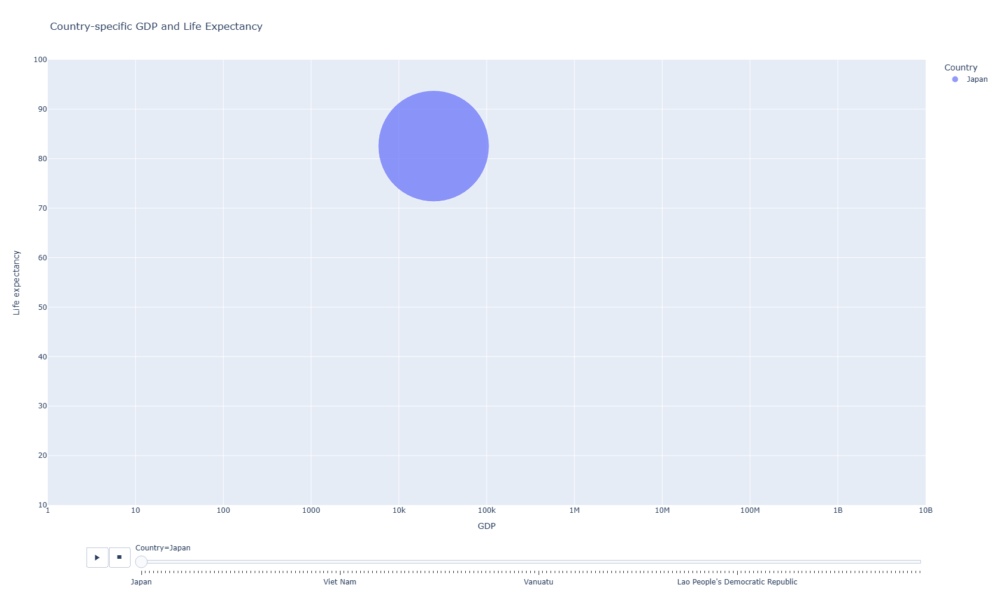

In [89]:
# Plotly를 사용하여 산점도 그리기 (연도별 애니메이션 추가)

fig = px.scatter(df, x='GDP', y='Life expectancy', size='GDP', color='Country',
                 hover_name='Country', log_x=True, size_max=200, animation_frame='Country',
                 labels={'GDP': 'GDP', 'Life Expectancy': 'Life Expectancy'},
                 title='Country-specific GDP and Life Expectancy ', width=1000, height=1000)
fig.update_xaxes(range=[0, 10])
fig.update_yaxes(range=[10, 100])

# 그래프 보여주기
fig.show()
